# imports, mount Drive, set CUDA, global variables

In [1]:
import torch
import torchvision
from torchvision import transforms
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import h5py
import numpy as np
import matplotlib.pyplot as plt
from torchvision.transforms.functional import pad, normalize, resize
import matplotlib.patches as patches
import os
from  matplotlib.patches import Rectangle as rec
from torch import nn, Tensor
from torchvision.ops import box_iou
import random
from copy import deepcopy
from tqdm import tqdm
from torchvision.models.detection.image_list import ImageList
from sklearn.metrics import auc

!pip install pytorch_lightning &> /dev/null
import pytorch_lightning as pl
import pytorch_lightning.loggers as pl_loggers
import pytorch_lightning.callbacks as pl_callbacks

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if use_cuda else "cpu")
print(device)

cuda:0


In [4]:
h_img = 800
w_img = 1088
debug = False

# class : BuildDataset

In [5]:
class BuildDataset(torch.utils.data.Dataset):
    def __init__(self, path):
        self.images_path = os.path.join(path[0])  
        self.masks_path = os.path.join(path[1])    
        self.labels_path = os.path.join(path[2])
        self.bboxes_path = os.path.join(path[3])
        self.images = np.array(h5py.File(self.images_path, 'r')['data'])    #transformation needed : 0-1, resize, normalize, pad
        self.masks = np.array(h5py.File(self.masks_path, 'r')['data'])      #transformation needed : resize, pad
        self.bboxes = np.load(self.bboxes_path, allow_pickle=True, encoding='latin1')    #transformation needed : scaling and add padding
        self.labels = np.load(self.labels_path, allow_pickle=True, encoding='latin1')
        self.indexes = []
        temp = 0
        for i in range(len(self.images)):
          self.indexes.append(temp)
          temp += self.labels[i].shape[0]
          
        self.indexes = np.array(self.indexes)

    def __getitem__(self, index):
        #example : images[5] has 2 objects in it; so there will be 2 labels, 2 corresponding masks and 2 corresponding bounding boxes
        image = torch.from_numpy(self.images[index].astype('float32')).to(device)                                               #previously was uint32
        labels = torch.from_numpy(self.labels[index]).to(device)                                                                #int64
        n_obj = labels.shape[0]                  #number of objects present in the image
        masks = torch.from_numpy(self.masks[self.indexes[index] : self.indexes[index] + n_obj].astype('float32')).to(device)    #previously was uint32
        bboxes = torch.from_numpy(self.bboxes[index]).to(device)                                                                #float32  
        transed_img, transed_masks, transed_bboxes = self.pre_process_single(image, masks, bboxes)
        return transed_img, labels, transed_masks, transed_bboxes, index

    #the 3 transformations below are defined for single image and its corresponding (sometimes multiple) masks and bounding boxes
    def pre_process_single(self, image, masks, bboxes):   
        #img transformation : 0-1, resize, normalize, pad
        img = pad(normalize(resize(torch.div(image, 255), size=(800,1066)), (0.485,0.456,0.406), (0.229,0.224,0.225)), [11,0])
        #mask transformation : resize, pad
        new_masks = pad(resize(masks, size=(800,1066)), [11,0])
        #bounding boxes transformation : scaling and pad
        old_h = 300
        old_w = 400
        new_h = 800
        new_w = 1066
        padding = 22
        scale_x = new_w/old_w
        scale_y = new_h/old_h
        new_bboxes = torch.zeros_like(bboxes)
        new_bboxes[:,0] = scale_x * bboxes[:,0] - padding/2
        new_bboxes[:,1] = scale_y * bboxes[:,1]
        new_bboxes[:,2] = scale_x * bboxes[:,2] + padding/2
        new_bboxes[:,3] = scale_y * bboxes[:,3]

        return img, new_masks, new_bboxes
       
    def __len__(self):
        return len(self.images)

# class : BuildDataloader

In [6]:
class BuildDataLoader(torch.utils.data.DataLoader):
    def __init__(self, dataset, batch_size, shuffle, num_workers):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.num_workers = num_workers

    def collect_fn(self, batch):
        images, labels, masks, bounding_boxes, index = list(zip(*batch))
        return torch.stack(images), labels, masks, bounding_boxes, index

    def loader(self):
        return DataLoader(self.dataset,
                          batch_size=self.batch_size,
                          shuffle=self.shuffle,
                          num_workers=self.num_workers,
                          collate_fn=self.collect_fn)

# initialize backbone and RPN

In [7]:
def pretrained_models_680(checkpoint_file, eval=True):
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=False)
    if(eval):
        model.eval()
    model.to(device)        
    backbone = model.backbone
    rpn = model.rpn

    if(eval):
        backbone.eval()
        rpn.eval()

    rpn.nms_thresh=0.6
    checkpoint = torch.load(checkpoint_file)
    backbone.load_state_dict(checkpoint['backbone'])
    rpn.load_state_dict(checkpoint['rpn'])

    return backbone, rpn

In [8]:
pretrained_path = "/content/drive/MyDrive/CIS680/HW4/checkpoint680.pth"

In [9]:
backbone, rpn = pretrained_models_680(pretrained_path)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

# class : BoxHead

In [10]:
class BoxHead(nn.Module):
    def __init__(self):
        super(BoxHead, self).__init__()
        self.num_classes = 3
        self.P = 7
        self.intermediate = nn.Sequential(#linear 1
                                          nn.Linear(in_features=256*self.P*self.P, out_features=1024),
                                          nn.ReLU(),
                                          #linear 2
                                          nn.Linear(in_features=1024, out_features=1024),
                                          nn.ReLU(),
                                          )
        #maybe softmax is not advised for training in the classifier. verify later
        self.classifier = nn.Sequential(
                                        nn.Linear(in_features=1024, out_features=self.num_classes + 1), 
                                        #nn.Softmax()
                                        )
        self.regressor = nn.Sequential(
                                       nn.Linear(in_features=1024, out_features=int(4*self.num_classes))
                                      )
        
    '''
    input : proposals:  list len batch_size each tensor of dim (top_k_proposals, 4) [format : (x1, y1, x2, y2)]
    output : feature_vectors : (bs*top_k_proposals, 256*P*P) = (total_proposals, 256*P*P)
    function is for a batch
    '''
    def find_feature_vectors(self, batch_proposals, fpn_feat_list):
        #regardless of number of objects in each image, there would only be top k proposal boxes fixed. the top_k value is up to us.
        feature_vectors = []
        #loop over batch
        for i in range(len(batch_proposals)):
          #loop over each proposal
          for p in range(len(batch_proposals[i])):
            pb = batch_proposals[i][p]    #these will be 1 proposal
            #convert proposal box from x1,y1,x2,y2 to x,y,w,h format
            x = (pb[0] + pb[2])/2.0
            y = (pb[1] + pb[3])/2.0
            w = pb[2] - pb[0]
            h = pb[3] - pb[1]
            #choose appropriate fpn level to pool features
            k = torch.clamp(torch.floor(4 + torch.log2(torch.sqrt(w*h)/224)), 2, 5)
            fpn_level = (k - 2.0).int()     #this is a single integer value
            #region of proposal box is given in image coords but we need to change them to feature map coords
            scale_x = fpn_feat_list[fpn_level].shape[3]/1088
            scale_y = fpn_feat_list[fpn_level].shape[2]/800
            #scale the proposal box to feature map coords
            p_scaled = pb.reshape(1,-1).clone()    #(1,4)
            p_scaled[:,0] = p_scaled[:,0] * scale_x
            p_scaled[:,1] = p_scaled[:,1] * scale_y
            p_scaled[:,2] = p_scaled[:,2] * scale_x
            p_scaled[:,3] = p_scaled[:,3] * scale_y
            #do ROI align of feature map and proposal box (both in x1,y1,x2,y2 format)
            fv  = torchvision.ops.roi_align(fpn_feat_list[fpn_level][i].unsqueeze(0), [p_scaled.to(device)] , output_size=self.P, spatial_scale=1,sampling_ratio=-1)
            feature_vectors.append(fv.flatten())  #appended (1 * 256 * P * P) 
          
        feature_vectors = torch.vstack(feature_vectors) #should be (bs * topK, 256*P^2)
        return feature_vectors

    '''
    input : feature_vectors : (total_proposals , 256*P^2) (bs*top_k_proposals = total_proposals)
    outputs : class_prob : (total_proposals, num_classes+1)
              bbox_reg : (total_proposals, num_classes*4)
    '''
    def box_head(self, feature_vectors):
        X = self.intermediate(feature_vectors)
        class_prob = self.classifier(X)
        bbox_reg = self.regressor(X)

        return class_prob, bbox_reg

    '''
    input : feature_vectors : (bs, 3, h_img, w_img)
    outputs : class_prob : (total_proposals, num_classes+1)
              bbox_reg : (total_proposals, num_classes*4)
    '''
    def forward(self, feature_vectors):
        #we do not want to retrain our backbone and rpn so even when eval=False for the rest of the network, it is true for backbone and rpn
        #pass feature vectors to box head and get class prob and bbox_regressionss
        class_prob, bbox_reg = self.box_head(feature_vectors)
        #print(class_prob.shape)
        #print(bbox_reg.shape)
        return class_prob, bbox_reg
    
    '''
    inputs : bboxes :  (n_objects, 4)
             proposals : (top_K proposals, 4) 
             labels :  (n_objects,)
    outputs : gt_class : (top_K proposals, num_classes+1)
              gt_coord : (top_K proposals, num_classes*4)
    note :
    defined for 1 image
    bboxes are in the form : x1,y1,x2,y2
    proposals are in the form : x1,y1,x2,y2
    '''
    def create_ground_truth(self, bboxes, proposals, labels):
        #print(labels)
        #initialize ground truth class and ground truth coords
        gt_class = torch.zeros((proposals.shape[0], self.num_classes+1)).to(device)
        gt_coord = torch.zeros((proposals.shape[0], self.num_classes*4)).to(device)
        en_gtcoord = torch.zeros((proposals.shape[0], self.num_classes*4)).to(device)
        #calculte iou
        iou = box_iou(proposals,bboxes) #shape is (topK, n_obj)  #  ORDER IS IMPORTANT!
        max_iou, idx = torch.max(iou, dim=1)        #find max iou and if that iou is >= 0.5 only then take corresponding index. 
                                                    #do this for each object in the image
        chosen_idx = max_iou>=0.5

        #ASSIGNING GROUND TRUTH LABELS
        #for the ground truth class, label=channel will hold 1 (one hot encoding)
        gt_class[chosen_idx, labels[idx[chosen_idx]]] = 1
        #print(gt_class)
        #for background we have to do this. big brain time!
        bg_idx = torch.all(iou<0.5,dim=1)
        gt_class[bg_idx, 0] = 1
        #print(gt_class)

        #ASSIGNING GROUND TRUTH BBOXES
        #for ground truth bboxes we take the following steps
        #convert bboxes from x1,y1,x2,y2 to x,y,w,h
        converted_bboxes = torch.zeros_like(bboxes)
        converted_bboxes[:,0] = (bboxes[:,0] + bboxes[:,2])/2.0
        converted_bboxes[:,1] = (bboxes[:,1] + bboxes[:,3])/2.0
        converted_bboxes[:,2] = bboxes[:,2] - bboxes[:,0]
        converted_bboxes[:,3] = bboxes[:,3] - bboxes[:,1]
        #convert all proposals from x1,y1,x2,y2 to x,y,w,h 
        proposals[:, 0] = (proposals[:, 0] + proposals[:, 2])/2.0
        proposals[:, 1] = (proposals[:, 1] + proposals[:, 3])/2.0
        proposals[:, 2] = (proposals[:, 2] - proposals[:, 0])
        proposals[:, 3] = (proposals[:, 3] - proposals[:, 1])
        #encode to tx,ty,tw,th
        encoded_bboxes = torch.zeros_like(proposals)
        encoded_bboxes[:,0] = (converted_bboxes[idx,0] - proposals[:, 0])/proposals[:, 2]
        encoded_bboxes[:,1] = (converted_bboxes[idx,1] - proposals[:, 1])/proposals[:, 3]
        encoded_bboxes[:,2] = torch.log(converted_bboxes[idx,2]/proposals[:, 2])
        encoded_bboxes[:,3] = torch.log(converted_bboxes[idx,3]/proposals[:, 3])
        #assign to gt_coord at appropriate indices
        lbl = torch.where(gt_class==1)[1]     #get the labels, including when the label is background (0)
        lbl_idx = lbl.nonzero().flatten()     #we want to insert only the non background boxes to the gt_coord matrix. 
                                              #so we take only those indices which have non zero values
        for j in range(len(lbl_idx)):
          gt_coord[lbl_idx[j], (lbl[lbl_idx[j]]-1)*4:lbl[lbl_idx[j]]*4] = proposals[j]
          en_gtcoord[lbl_idx[j], (lbl[lbl_idx[j]]-1)*4:lbl[lbl_idx[j]]*4] = encoded_bboxes[j]
        #print(gt_coord)

        return gt_class, gt_coord, en_gtcoord
    
    '''
    inputs : bboxes :  list(bs)(n_objects, 4)
             proposals : list(bs)(top_K proposals, 4) 
             labels :  list (bs)(n_objects,)
    outputs : gt_class : (total_proposals, num_classes+1)
              gt_coord : (total_proposals, num_classes*4) (bs*top_k_proposals = total_proposals)
    '''
    def create_batch_truth(self, bboxes, proposals, labels):
        gt_class_batch = []
        gt_coord_batch = []
        for b in range(len(proposals)): #iterate over each image in the batch
          gt_class, _, gt_coord = self.create_ground_truth(bboxes[b], proposals[b], labels[b])
          gt_class_batch.append(gt_class)
          gt_coord_batch.append(gt_coord)
        gt_class_batch = torch.vstack(gt_class_batch)
        gt_coord_batch = torch.vstack(gt_coord_batch)

        return gt_class_batch, gt_coord_batch
        
    '''
    inputs : class_prob : (total_proposals, num_classes+1)
             bbox_reg : (total_proposals, num_classes*4)
             gt_class : (total_proposals, num_classes+1)
             gt_coord : (total_proposals, num_classes*4) (bs*top_k_proposals = total_proposals) these are encoded
    outputs : loss, loss_class, loss_reg
    notes : loss is for full batch of bs images
            labels : vehicle, human, animal means positive; background means negative
            make positive and negative stuff only for classifier loss
            use only positive classifier stuff for regressor loss
            effective batch is basically a subset taken from the batch of proposals (total_proposals me se liya hua batch)
    '''
    def compute_loss(self, class_prob, bbox_reg, gt_class, gt_coord, l=1, effective_batch=50):
        #computing classifier loss on both positive and negative labels
        lbl = torch.where(gt_class==1)[1]
        l_p = (lbl!=0).nonzero().flatten()
        l_n = (lbl==0).nonzero().flatten()
        p_size = min(l_p.shape[0], int(effective_batch*3/4))
        n_size = min(l_n.shape[0], int(effective_batch/4))
        p_id = torch.randperm(l_p.shape[0])[:p_size]
        p_id = l_p[p_id]
        n_id = torch.randperm(l_n.shape[0])[:n_size]
        n_id = l_n[n_id]
        p_class_prob = class_prob[p_id,:]   #wherever the column element in zeroth column is NOT 1, take those corresponding rows and use the postive mask (some object is detected)
        n_class_prob = class_prob[n_id,:]   #wherever the column element in zeroth column is 1, take those corresponding rows and use the negative mask (this is the background)
        p_gt_class = gt_class[p_id,:]
        n_gt_class = gt_class[n_id,:]

        criterion_class = torch.nn.CrossEntropyLoss()
        #doing pos and neg wise CE loss and summing
        loss_class_p = criterion_class(p_class_prob, p_gt_class)
        loss_class_n = criterion_class(n_class_prob, n_gt_class)
        loss_class = loss_class_p + loss_class_n
        #print(loss_class)
        
        #computing regressor loss only on the positive bboxes 
        p_bbox_reg = bbox_reg[p_id,:]
        p_gt_coord = gt_coord[p_id,:]
        criterion_reg = torch.nn.SmoothL1Loss()   #default reduction is mean so we do not have to divide by N_reg
        #doing class label wise smooth L1 loss and then summing
        loss_reg_1 = sum([criterion_reg(p_bbox_reg[:,i], p_gt_coord[:,i]) for i in range(4)])     #vehicle
        loss_reg_2 = sum([criterion_reg(p_bbox_reg[:,i], p_gt_coord[:,i]) for i in range(4,8)])   #human
        loss_reg_3 = sum([criterion_reg(p_bbox_reg[:,i], p_gt_coord[:,i]) for i in range(8,12)])  #animal
        loss_reg = loss_reg_1 + loss_reg_2 + loss_reg_3
        #print(loss_reg)

        #computing total loss
        loss = loss_class + l * loss_reg

        return loss, loss_class, loss_reg

    '''
    for 1 image only (with multiple bboxes and corresponding confidence scores and labels)
    inputs : conf len(bs) (keep_num_preNMS)
             bboxes len(bs) (keep_num_preNMS,4)
             lbl len(bs) (keep_num_preNMS)
    outputs : conf len(bs) (keep_num_postNMS)
             bboxes len(bs) (keep_num_postNMS,4)
             lbl len(bs) (keep_num_postNMS)
    '''
    def NMS(self, conf, bbox, lbl, thresh):
        bbox_clone = bbox.clone().detach()
        conf_clone = conf.clone().detach()
        lbl_clone = lbl.clone().detach()
        nms_box = []
        nms_conf = []
        nms_lbl = []
        bbox_clone = list(bbox_clone)
        conf_clone = list(conf_clone)
        lbl_clone = list(lbl_clone)

        while len(bbox_clone)!=0:
          #get the top value of box, conf and labels
          curr_box = bbox_clone[0]
          curr_conf = conf_clone[0]
          curr_lbl = lbl_clone[0]
          #remove them from clone lists
          bbox_clone.remove(curr_box)
          conf_clone.remove(curr_conf)
          lbl_clone.remove(curr_lbl)
          #append them into corresponding nms lists
          nms_box.append(curr_box)
          nms_conf.append(curr_conf)
          nms_lbl.append(curr_lbl)
          for i, other_bboxes in enumerate(bbox_clone):
            if(box_iou((curr_box).reshape(1,4), other_bboxes.reshape(1,4))[0]>thresh):
              del bbox_clone[i]
              del conf_clone[i]
              del lbl_clone[i]

        #---REVISIT AND FIX----
        #for now if the predicted image is not a background then the nms is applied
        #if the predicted image is background then the same pre_nms stuff is returned
        if nms_conf:
          return torch.stack(nms_conf), torch.stack(nms_box), torch.stack(nms_lbl)
        else:
          return conf, bbox, lbl

    '''
    inputs : proposals len(bs) (top_K_proposals,4)
             classprob (total_proposals,C+1)    total_proposals = topK_proposals * bs
             bbox_reg (total_proposals, C*4)
    outputs : bboxes len(bs) (keep_num_postNMS,4)
              scores len(bs) (keep_num_postNMS)
              labels len(bs) (keep_num_postNMS)
              #same things for (keep_num_preNMS)
    '''
    def post_process(self, class_prob, bbox_reg, proposals, conf_thresh = 0.2, keep_num_preNMS = 10, keep_num_postNMS = 5, keep_topK = 200):
        postnms_bboxes = []
        postnms_scores = []
        postnms_labels = []
        prenms_bboxes = []
        prenms_scores = []
        prenms_labels = []
        for img_id in range(len(proposals)):
          c_prob = class_prob[int(img_id*keep_topK) : int((img_id+1)*keep_topK), :] #(top_K_propsals,C+1)
          prop = proposals[img_id]
          b_reg = bbox_reg[int(img_id*keep_topK) : int((img_id+1)*keep_topK), :] #(top_K_propsals,C*4)
          lbl = torch.argmax(c_prob, axis=1)
          conf_max = torch.max(c_prob, axis=1)[0]
          #mask is when confidence is more than the threshold and the label is nonzero (so that no background is coming)
          mask = torch.logical_and(conf_max>conf_thresh, lbl>0)
          #keep only the masked class probabilities, masked labels, masked bbox regressions and masked proposals
          m_conf, m_lbl, m_b_reg, m_prop = conf_max[mask], lbl[mask], b_reg[mask], prop[mask]
          #keep value will be the min of pre decided preNMS number and the number of confidence scores left
          keep = min(keep_num_preNMS, len(m_conf))
          #sort the confidence scores in descending order and keep only as many as keep value
          kept_idx = torch.argsort(m_conf, dim = 0, descending=True)[:keep]
          keep_conf, keep_lbl, keep_b_reg, keep_prop = m_conf[kept_idx], m_lbl[kept_idx], m_b_reg[kept_idx], m_prop[kept_idx]
          #transform the bboxes from (keep, C*4) to (keep, 4) for easiness and also for passing into NMS
          reshaped_keepbreg = torch.zeros((len(keep_b_reg),4)).to(device)
          for b in range(len(keep_b_reg)):
            reshaped_keepbreg[b,:] = keep_b_reg[b, int(keep_lbl[b]-1)*4:(int(keep_lbl[b]-1)*4)+4]
          #decoding reshaped_keepbreg with corresponding keep_prop (convert keep_prop to x,y,w,h) form and then find x*,y*,w*,h* then convert to x1,y1,x2,y2
          decoded = torch.zeros_like(reshaped_keepbreg).to(device)
          xp = (keep_prop[:, 0] + keep_prop[:, 2])/2.0
          yp = (keep_prop[:, 1] + keep_prop[:, 3])/2.0
          wp = (keep_prop[:, 2] - keep_prop[:, 0])
          hp = (keep_prop[:, 3] - keep_prop[:, 1])
          x = (reshaped_keepbreg[:,0] * wp) + xp
          y = (reshaped_keepbreg[:,1] * hp) + yp
          w = torch.exp(reshaped_keepbreg[:,2]) * wp
          h = torch.exp(reshaped_keepbreg[:,3]) * hp
          decoded[:,0] = torch.clip(x-w/2, min=0) #x1
          decoded[:,1] = torch.clip(y-h/2, min=0) #y1
          decoded[:,2] = torch.clip(x+w/2, max=1088) #x2
          decoded[:,3] = torch.clip(y+h/2, max=800) #y2
          #collect all prenms bboxes, scores, labels
          prenms_bboxes.append(decoded)
          prenms_scores.append(keep_conf)
          prenms_labels.append(keep_lbl)
          #do NMS
          after_conf, after_bboxes, after_labels = self.NMS(keep_conf, decoded, keep_lbl, 0.5)
          #collect all postnms bboxes, scores, labels
          after_keep = min(keep_num_postNMS, len(after_conf))
          postnms_bboxes.append(after_bboxes[:after_keep])
          postnms_scores.append(after_conf[:after_keep])
          postnms_labels.append(after_labels[:after_keep])
       
        #return pre and post nms bboxes, scores, labels
        return prenms_bboxes, prenms_scores, prenms_labels, postnms_bboxes, postnms_scores, postnms_labels

# instantiate the BuildDataset and BuildDataloader classes

In [11]:
imgs_path = 'drive/MyDrive/CIS680/HW4/images.h5'
masks_path = 'drive/MyDrive/CIS680/HW4/masks.h5'
labels_path = 'drive/MyDrive/CIS680/HW4/labels.npy'
bboxes_path = 'drive/MyDrive/CIS680/HW4/bboxes.npy'

paths = [imgs_path, masks_path, labels_path, bboxes_path]
dataset = BuildDataset(paths)

subset = []
for i in range(300):
   subset.append(dataset[i])

full_size = len(subset)
train_size = int(full_size * 0.8)
test_size = full_size - train_size

torch.random.manual_seed(1)
train_dataset, test_dataset = torch.utils.data.random_split(subset, [train_size, test_size])

batch_size = 8
print("batch size:", batch_size)
test_build_loader = BuildDataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
test_loader = test_build_loader.loader()
train_build_loader = BuildDataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
train_loader = train_build_loader.loader()
full_build_loader = BuildDataLoader(subset, batch_size=batch_size, shuffle=False, num_workers=0)
full_loader = full_build_loader.loader()

batch size: 8


In [12]:
del train_dataset
del test_dataset
del dataset

# training

In [13]:
network_obj = BoxHead().to(device)
optimizer = torch.optim.Adam(network_obj.parameters(), lr = 0.001)

train_loss = []
train_loss_c = []
train_loss_r = []
val_loss = []
val_loss_c = []
val_loss_r = []
num_epochs = 20
keep_topK = 200

for epoch in tqdm(range(num_epochs)):
  run_loss = 0
  run_loss_c = 0
  run_loss_r = 0
  #train the model
  network_obj.train()
  for i, (images, labels, masks, bboxes, indexes) in enumerate(train_loader):
    #pass through backbone
    backout = backbone(images.to(device))
    im_lis = ImageList(images, [(800, 1088)]*images.shape[0])
    #pass thorugh rpn, get proposals and fpn_feat_list
    rpnout = rpn(im_lis, backout)
    proposals=[proposal[0:keep_topK,:] for proposal in rpnout[0]]
    fpn_feat_list= list(backout.values())
    #get gt
    gt_class_batch, gt_coord_batch = network_obj.create_batch_truth(bboxes, proposals, labels)
    #get feature vectors
    feature_vectors = network_obj.find_feature_vectors(proposals, fpn_feat_list)
    #pass through forward
    class_prob, bbox_reg = network_obj.forward(feature_vectors.detach())      #TO ENSURE NO RETRAINING OF THE BACKBONE AND RPN
    #zero out optimizer
    optimizer.zero_grad()
    #calc the loss
    #CE loss already does softmax so we dont add it in the classifier network during training
    loss, loss_class ,loss_reg = network_obj.compute_loss(class_prob, bbox_reg, gt_class_batch.to(device), gt_coord_batch.to(device),effective_batch=150)
    #gather loss values
    run_loss += loss.item()
    run_loss_c += loss_class.item()
    run_loss_r += loss_reg.item()
    #backward pass
    loss.backward()
    optimizer.step()
    #empty intermediate predcitions 
    del class_prob, bbox_reg, gt_class_batch, gt_coord_batch
    torch.cuda.empty_cache()

  train_loss.append(run_loss/len(full_loader))
  train_loss_c.append(run_loss_c/len(full_loader))
  train_loss_r.append(run_loss_r/len(full_loader))

  # checkpoint
  if(epoch%2==0):
    path = "/content/drive/MyDrive/CIS680/HW4/4B" +str(epoch+1)
    torch.save({
        'epoch': epoch+1,
        'model_state_dict': network_obj.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': run_loss/len(full_loader),
        'clas_loss': run_loss_c/len(full_loader),
        'regr_loss': run_loss_r/len(full_loader)
        }, path)
  
  #validating the model
  network_obj.eval()
  run_eval_loss = 0
  run_eval_loss_c = 0
  run_eval_loss_r = 0
  for j, (images, labels, masks, bboxes,indexes) in enumerate(test_loader):
    #pass through backbone
    backout = backbone(images.to(device))
    im_lis = ImageList(images, [(800, 1088)]*images.shape[0])
    #pass thorugh rpn, get proposals and fpn_feat_list
    rpnout = rpn(im_lis, backout)
    proposals=[proposal[0:keep_topK,:] for proposal in rpnout[0]]
    fpn_feat_list= list(backout.values())
    #get gt
    vgt_class_batch, vgt_coord_batch = network_obj.create_batch_truth(bboxes, proposals, labels)
    #get feature vectors
    vfeature_vectors = network_obj.find_feature_vectors(proposals, fpn_feat_list)
    #pass through forward
    vclass_prob, vbbox_reg = network_obj.forward(vfeature_vectors.detach())      #TO ENSURE NO RETRAINING OF THE BACKBONE AND RPN
    #calc the loss
    vloss, vloss_class ,vloss_reg = network_obj.compute_loss(vclass_prob, vbbox_reg, vgt_class_batch.to(device), vgt_coord_batch.to(device),effective_batch=150)
    run_eval_loss += vloss.item()
    run_eval_loss_c += vloss_class.item()
    run_eval_loss_r += vloss_reg.item()
    del vclass_prob, vbbox_reg, vgt_class_batch, vgt_coord_batch
    torch.cuda.empty_cache()

  val_loss.append(run_eval_loss/len(full_loader))
  val_loss_c.append(run_eval_loss_c/len(full_loader))
  val_loss_r.append(run_eval_loss_r/len(full_loader))

100%|██████████| 20/20 [14:14<00:00, 42.75s/it]


# train and validation plots

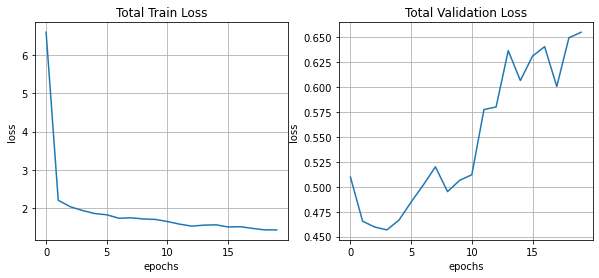

In [14]:
fig, ax = plt.subplots(1, 2, figsize=(10,4))

ax[0].plot(train_loss)
ax[0].set_title('Total Train Loss')
ax[0].set_xlabel('epochs')
ax[0].set_ylabel('loss')
ax[0].grid()

ax[1].plot(val_loss)
ax[1].set_title('Total Validation Loss')
ax[1].set_xlabel('epochs')
ax[1].set_ylabel('loss')
ax[1].grid()

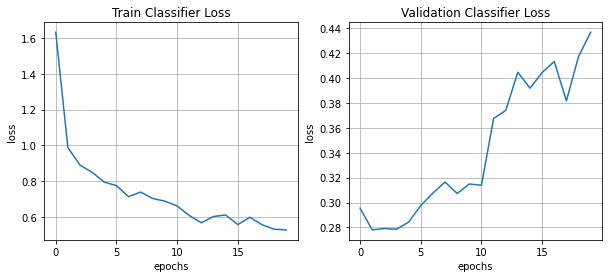

In [15]:
fig, ax = plt.subplots(1, 2, figsize=(10,4))

ax[0].plot(train_loss_c)
ax[0].set_title('Train Classifier Loss')
ax[0].set_xlabel('epochs')
ax[0].set_ylabel('loss')
ax[0].grid()

ax[1].plot(val_loss_c)
ax[1].set_title('Validation Classifier Loss')
ax[1].set_xlabel('epochs')
ax[1].set_ylabel('loss')
ax[1].grid()

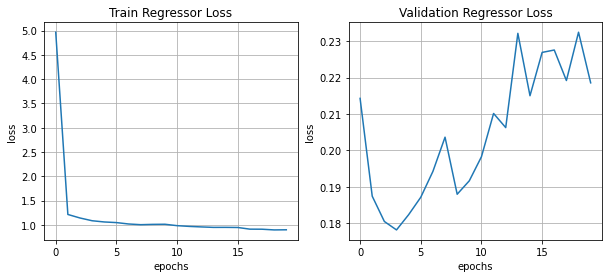

In [16]:
fig, ax = plt.subplots(1, 2, figsize=(10,4))

ax[0].plot(train_loss_r)
ax[0].set_title('Train Regressor Loss')
ax[0].set_xlabel('epochs')
ax[0].set_ylabel('loss')
ax[0].grid()

ax[1].plot(val_loss_r)
ax[1].set_title('Validation Regressor Loss')
ax[1].set_xlabel('epochs')
ax[1].set_ylabel('loss')
ax[1].grid()

#visualize GT

In [13]:
#display the ground truth along with proposals 
display_obj = BoxHead()
#proposals are in the form (x1,y1,x2,y2)
#bboxes are in the form (x1,y1,x2,y2)
#gt_coord are in the form (tx,ty,tw,th)
def visualize_gt(keep_topK=20):
  for iter, batch in enumerate(test_loader, 0):   #batch is : image, labels, masks, bboxes, indexes
    images = batch[0]
    labels = batch[1]
    bboxes = batch[3]
    #pass through backbone
    backout = backbone(images.to(device))
    im_lis = ImageList(images, [(800, 1088)]*images.shape[0])
    #pass thorugh rpn, get proposals and fpn_feat_list
    rpnout = rpn(im_lis, backout)
    proposals=[proposal[0:keep_topK,:] for proposal in rpnout[0]]
    for i in range(len(proposals)): #iterates bs times so goes over each image
      #display the image
      fig = plt.figure()
      ax = fig.add_subplot()
      ax.imshow(images[i].detach().cpu().numpy().transpose(1,2,0))


      #display the original bounding box given in the data
      for n_obj in range(len(labels[i])):
        if (labels[i][n_obj]==1): #vehicle
          rect = rec((bboxes[i][n_obj][0].cpu(),bboxes[i][n_obj][1].cpu()),bboxes[i][n_obj][2].cpu()-bboxes[i][n_obj][0].cpu(),bboxes[i][n_obj][3].cpu()-bboxes[i][n_obj][1].cpu(),linewidth=2,edgecolor='red',facecolor='none')
          ax.add_patch(rect)
        elif (labels[i][n_obj]==2): #human
          rect = rec((bboxes[i][n_obj][0].cpu(),bboxes[i][n_obj][1].cpu()),bboxes[i][n_obj][2].cpu()-bboxes[i][n_obj][0].cpu(),bboxes[i][n_obj][3].cpu()-bboxes[i][n_obj][1].cpu(),linewidth=2,edgecolor='green',facecolor='none')
          ax.add_patch(rect)
        elif (labels[i][n_obj]==3): #animal
          rect = rec((bboxes[i][n_obj][0].cpu(),bboxes[i][n_obj][1].cpu()),bboxes[i][n_obj][2].cpu()-bboxes[i][n_obj][0].cpu(),bboxes[i][n_obj][3].cpu()-bboxes[i][n_obj][1].cpu(),linewidth=2,edgecolor='blue',facecolor='none')
          ax.add_patch(rect)


      #display the gt_coords
      gt_class, gt_coord, _ = display_obj.create_ground_truth(bboxes[i], proposals[i], labels[i])
      #bg_proposals = proposals[i][gt_class[:,0] == 1, :]
      v_gt_coord = gt_coord[gt_class[:,1] == 1, 0:4].cpu()
      h_gt_coord = gt_coord[gt_class[:,2] == 1, 4:8].cpu()
      a_gt_coord = gt_coord[gt_class[:,3] == 1, 8:].cpu()
      if v_gt_coord.shape[0]:
        for ele in range(len(v_gt_coord)):
           rect = rec((v_gt_coord[ele,0],v_gt_coord[ele,1]),v_gt_coord[ele,2]-v_gt_coord[ele,0],v_gt_coord[ele,3]-v_gt_coord[ele,1],linewidth=2,edgecolor='pink',facecolor='none')
           ax.add_patch(rect)
      if h_gt_coord.shape[0]:
        for ele in range(len(h_gt_coord)):
           rect = rec((h_gt_coord[ele,0],h_gt_coord[ele,1]),h_gt_coord[ele,2]-h_gt_coord[ele,0],h_gt_coord[ele,3]-h_gt_coord[ele,1],linewidth=2,edgecolor='lightgreen',facecolor='none')
           ax.add_patch(rect)
      if a_gt_coord.shape[0]:
        for ele in range(len(a_gt_coord)):
           rect = rec((a_gt_coord[ele,0],a_gt_coord[ele,1]),a_gt_coord[ele,2]-a_gt_coord[ele,0],a_gt_coord[ele,3]-a_gt_coord[ele,1],linewidth=2,edgecolor='lightblue',facecolor='none')
           ax.add_patch(rect)
      plt.show()
         

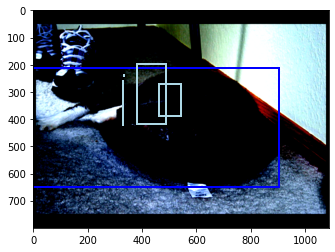

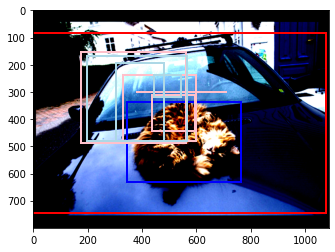

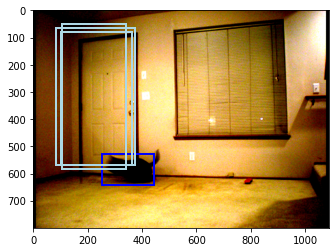

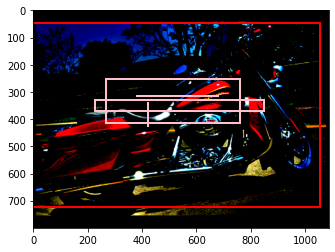

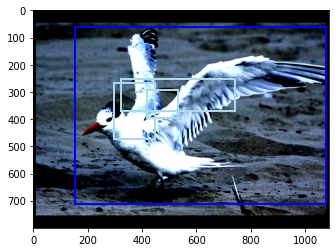

...

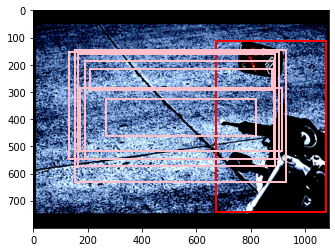

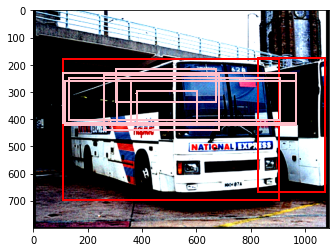

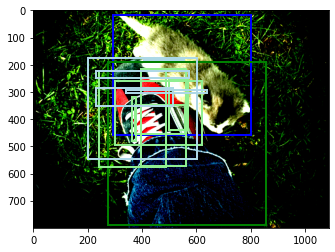

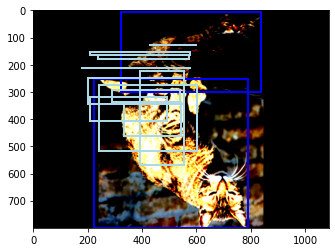

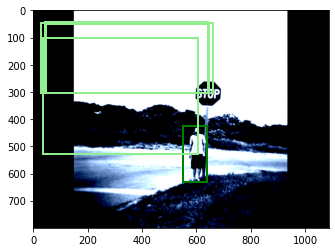

In [14]:
visualize_gt(keep_topK=20)

# load best model

In [13]:
#load best model (4B19) from checkpoint and predict on the test set

path = "/content/drive/MyDrive/CIS680/HW4/4B19"
checkpoint = torch.load(path)
test_model = BoxHead().to(device)

test_model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

# plot of top 20 boxes after BoxHead on test set

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  from ipykernel import kernelapp as app


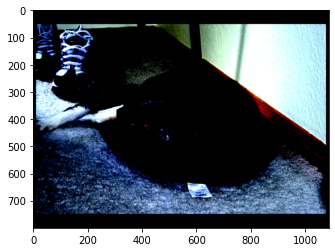

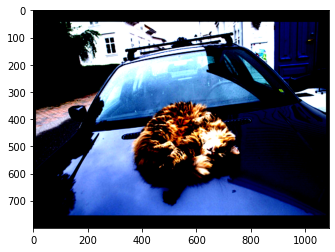

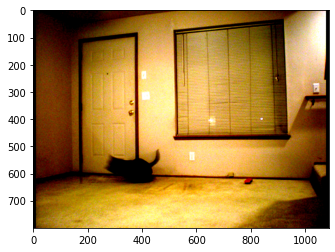

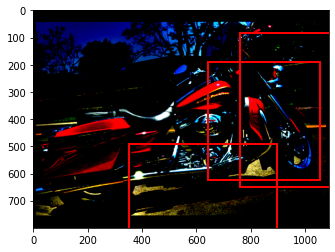

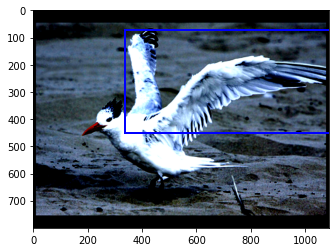

...

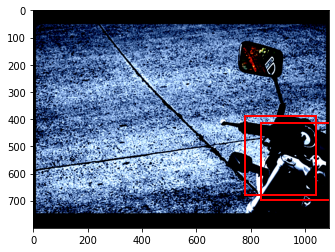

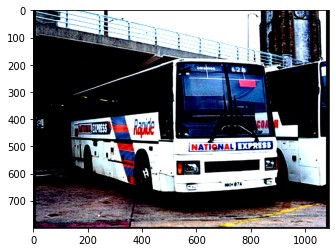

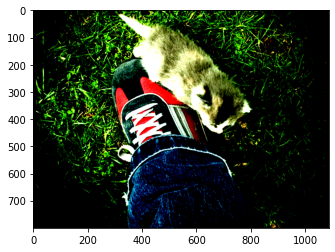

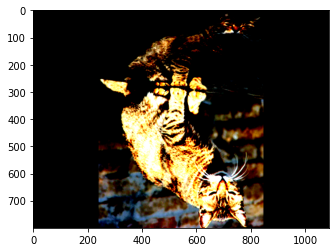

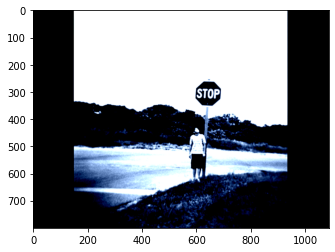

In [61]:
topK = 20
test_model.eval()
softmax = nn.Softmax()

with torch.no_grad():
  for i, (images, labels, masks, bboxes, indexes) in enumerate(test_loader):
    backout = backbone(images)
    im_lis = ImageList(images, [(800, 1088)]*images.shape[0])
    rpnout = rpn(im_lis, backout)
    proposals=[proposal[0:topK,:] for proposal in rpnout[0]]
    fpn_feat_list= list(backout.values())
    #get feature vectors
    feature_vectors = test_model.find_feature_vectors(proposals, fpn_feat_list)
    class_prob, bbox_reg = test_model.forward(feature_vectors.detach())      #TO ENSURE NO RETRAINING OF THE BACKBONE AND RPN
    cls_soft = softmax(class_prob)    #do softmax now as we did not do it in forward function
    #getmax confidence score and corresponding index
    cls_with_softmax, max_indices = torch.max(cls_soft,dim=1)  
    for i in range(len(images)):
        #display the image
        fig = plt.figure()
        ax = fig.add_subplot()
        ax.imshow(images[i].detach().cpu().numpy().transpose(1,2,0))

        cls_img, lbl = cls_with_softmax[i*topK:(i+1)*topK], max_indices[i*topK:(i+1)*topK]
        #iterate over proposals
        for j in range(len(proposals)):
          #if label is 0, it is background so ignore
          if(lbl[j]==0): 
            continue
          #get single proposal and bounding box
          edge_ind = (bbox_reg[j][((lbl[j]-1)*4).int() : ((lbl[j]-1)*4+4).int()]).cpu()
          prop = (proposals[i][j]).cpu()
          #decode the bounding box with corresponding proposal
          tx, ty, tw, th = edge_ind[0], edge_ind[1], edge_ind[2], edge_ind[3]
          xp, yp, wp, hp = (prop[0]+prop[2])/2, (prop[1]+prop[3])/2, prop[2]-prop[0], prop[3]-prop[1]
          x, y, w, h = tx*wp+xp, ty*hp+yp, torch.exp(tw)*wp, torch.exp(th)*hp
          x1, y1 = x-(w/2), y-(h/2)

          #plot the top 20 predicted bbox regressions
          if (lbl[j]==1): #----vehicle
            rect = rec((x1, y1),w,h,fill=False,color='r',linewidth=2)
            ax.add_patch(rect)
          if (lbl[j]==2): #----human
            rect = rec((x1, y1),w,h,fill=False,color='g',linewidth=2)
            ax.add_patch(rect)
          if (lbl[j]==3): #----animal
            rect = rec((x1, y1),w,h,fill=False,color='b',linewidth=2)
            ax.add_patch(rect)
        plt.show() 

# pre and post NMS plots

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  from ipykernel import kernelapp as app


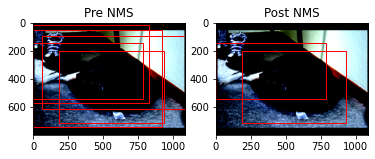

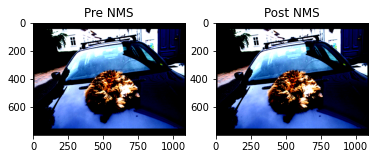

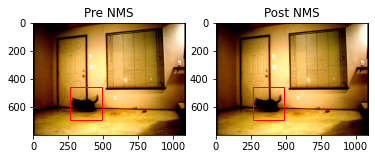

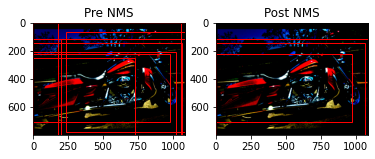

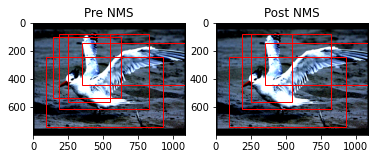

...

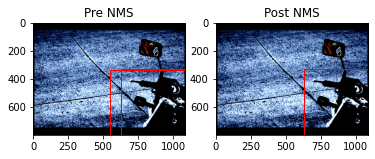

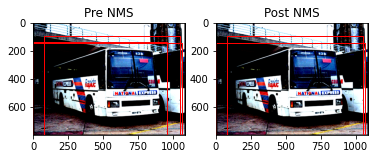

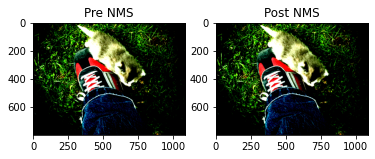

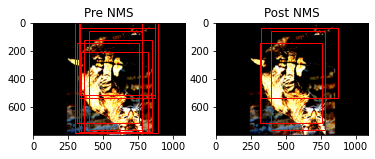

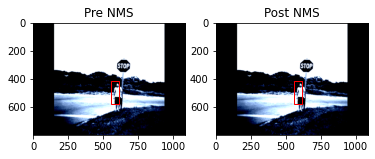

In [63]:
topK = 20
test_model.eval()
softmax = nn.Softmax()

with torch.no_grad():
  for i, (images, labels, masks, bboxes, indexes) in enumerate(test_loader):
    backout = backbone(images)
    im_lis = ImageList(images, [(800, 1088)]*images.shape[0])
    rpnout = rpn(im_lis, backout)
    proposals=[proposal[0:topK,:] for proposal in rpnout[0]]
    fpn_feat_list= list(backout.values())
    #get feature vectors
    feature_vectors = test_model.find_feature_vectors(proposals, fpn_feat_list)
    class_prob, bbox_reg = test_model.forward(feature_vectors.detach())      #TO ENSURE NO RETRAINING OF THE BACKBONE AND RPN
    cls_soft = softmax(class_prob)    #do softmax now as we did not do it in forward function
    pre_b, pre_s, pre_l, post_b, post_s, post_l = test_model.post_process(cls_soft, bbox_reg, proposals, conf_thresh = 0.2, keep_num_preNMS = 50, keep_num_postNMS = 20, keep_topK = topK)
    #iterate over each image in the batch
    for img_id in range(len(images)):
      fig,ax = plt.subplots(1,2)
      #plot preNMS boxes
      ax[0].imshow(images[img_id].detach().cpu().numpy().transpose(1,2,0))
      ax[0].set_title("Pre NMS")
      #iterate over each box
      for bbox in pre_b[img_id]:
        x1=int(bbox[0])
        y1=int(bbox[1])
        x2=int(bbox[2])
        y2=int(bbox[3]) 
        rect = rec((x1,y1),x2-x1,y2-y1,fill=False,color='r')
        ax[0].add_patch(rect)

      #plot postNMS boxes
      ax[1].imshow(images[img_id].detach().cpu().numpy().transpose(1,2,0))
      ax[1].set_title("Post NMS")
      #iterate over each box
      for bbox in post_b[img_id]:
        x1=int(bbox[0])
        y1=int(bbox[1])
        x2=int(bbox[2])
        y2=int(bbox[3])      
        rect = rec((x1,y1),x2-x1,y2-y1,fill=False,color='r')
        ax[1].add_patch(rect)
    plt.show()

# MAP

In [23]:
def average_precision(predictions, targets, iou_threshold=0.5):
    matches = []
    scores = []
    class_trues = torch.zeros(1, 3)
    class_true_positives = torch.zeros(1, 3)

    batch_size = len(predictions)
    
    for bidx in range(batch_size):
      match = torch.zeros(predictions[bidx][:,1].shape[0], 3)
      score = torch.zeros(match.shape)
      classwise_total_trues = torch.zeros(1, 3)
      classwise_true_positive = torch.zeros(classwise_total_trues.shape)

      for obj_label in targets[bidx][:,0]:
        classwise_total_trues[0, obj_label.type(torch.long)-1] += 1

      for obj_label in predictions[bidx][:,1]:
        classwise_true_positive[0, obj_label.type(torch.long)-1] += 1

      for i_pred, class_pred in enumerate(predictions[bidx][:,1]):
        class_pred = (class_pred).type(torch.int32)
        class_pred_scalar = int(class_pred.item()) - 1
        if class_pred_scalar in targets[bidx][:,0]:
          true_labels = (targets[bidx][:,0] == class_pred).nonzero(as_tuple=False).squeeze(0)
          for true_label in true_labels:
            predicted_box = predictions[bidx][:,2:][i_pred]
            true_box = targets[bidx][:,1:][true_label.item()-1]
            intersection_x1 = max(predicted_box[0], true_box[0])
            intersection_y1 = max(predicted_box[1], true_box[1])
            intersection_x2 = min(predicted_box[2], true_box[2])
            intersection_y2 = min(predicted_box[3], true_box[3])
            predicted_box_area = (predicted_box[2] - predicted_box[0]) * (predicted_box[3] - predicted_box[1])
            true_box_area = (true_box[2] - true_box[0]) * (true_box[3] - true_box[1])
            intersection_area = max((intersection_x2 - intersection_x1), 0) * max((intersection_y2 - intersection_y1), 0)
            union_area = predicted_box_area + true_box_area - intersection_area + 1e-15
            iou = intersection_area / union_area
            if iou > iou_threshold:
              match[i_pred, class_pred-1] = 1
        score[i_pred, class_pred-1] = predictions[bidx][:,0][int(i_pred)]

      matches.append(match)
      scores.append(score)
      class_trues = torch.cat([class_trues, classwise_total_trues], dim=0)
      class_true_positives = torch.cat([class_true_positives, classwise_true_positive], dim=0)

    class_precision = []
    class_recall = []
    class_auc = []
    match_values_all = torch.cat(matches)
    score_values_all = torch.cat(scores)
    total_trues_all = torch.sum(class_trues, dim=0)
    total_positives_all =  torch.sum(class_true_positives, dim=0)
    for class_id in range(3):
      match_values = match_values_all[:, class_id]
      score_values = score_values_all[:, class_id]
      total_trues = total_trues_all[class_id]
      total_positives = total_positives_all[class_id]

      area, sorted_recall, sorted_precision = None, None, None

      max_score = torch.max(score_values).item()
      ln = torch.linspace(0.2, max_score, steps=100)
      precision_mat = torch.zeros(101)
      recall_mat = torch.zeros(101)
      for i, th in enumerate(ln):
        matches = match_values[score_values > th]
        true_positives = torch.sum(matches)  # true positives
        precision = 1
        if total_positives > 0:
          precision = true_positives / total_positives

        recall = 1
        if total_trues > 0:
          recall = true_positives / total_trues

        precision_mat[i] = precision
        recall_mat[i] = recall

      recall_mat[100] = 0
      precision_mat[100] = 1
      sorted_idx = torch.argsort(recall_mat)
      sorted_recall = recall_mat[sorted_idx]
      sorted_precision = precision_mat[sorted_idx]
      area = auc(sorted_recall, sorted_precision)
      class_precision.append(sorted_precision)
      class_recall.append(sorted_recall)
      class_auc.append(area)
    return class_auc

def mean_average_precision(predictions, targets):
    ap = average_precision(predictions, targets, 0.5)
    ap_1, ap_2, ap_3 = ap
    mean_average_precision = (ap_1 + ap_2 + ap_3)/3.0

    return mean_average_precision, ap_1, ap_2, ap_3

In [24]:
topK = 200
test_model.eval()
softmax = nn.Softmax()

running_map = 0.
running_ap1 = 0.
running_ap2 = 0.
running_ap3 = 0.
with torch.no_grad():
  for i, (images, labels, masks, bboxes, indexes) in enumerate(test_loader, 0):
    backout = backbone(images)
    im_lis = ImageList(images, [(800, 1088)]*images.shape[0])
    rpnout = rpn(im_lis, backout)
    proposals=[proposal[0:topK,:] for proposal in rpnout[0]]
    fpn_feat_list= list(backout.values())
    feature_vectors = test_model.find_feature_vectors(proposals, fpn_feat_list)
    class_prob, bbox_reg = test_model.forward(feature_vectors.detach())      #TO ENSURE NO RETRAINING OF THE BACKBONE AND RPN
    cls_soft = softmax(class_prob)    #do softmax now as we did not do it in forward function
    pre_b, pre_s, pre_l, post_b, post_s, post_l = test_model.post_process(cls_soft, bbox_reg, proposals, conf_thresh = 0.2, keep_num_preNMS = 50, keep_num_postNMS = 20, keep_topK = topK)
    #targets: len(bs) (lbl, x1, y1, x2, y2)  lbl = [1, 2, 3] background not included
    #predictions: len(bs) (score, lbl, x1, y1, x2, y2)  lbl = [1, 2, 3] background not included
    targets = []
    predictions = []
    #iterate over each image in batch
    for img_id in range(len(images)):
      n_obj = len(labels[img_id])
      gt = torch.zeros((n_obj, 5))
      #iterate over each object present in the image (1 image can have 1 or more objects in it)
      for i in range(n_obj):
        l = labels[img_id][i]
        b = bboxes[img_id][i]
        gt[i] = torch.stack((l, b[0], b[1], b[2], b[3]))
      targets.append(gt)

      n_prop = len(post_b[img_id])
      temp = torch.zeros((n_prop, 6))
      #iterate over each post NMS predicted box
      for j in range(n_prop):
        s = post_s[img_id][j]
        l = post_l[img_id][j]
        b = post_b[img_id][j]
        temp[j] = torch.stack((s, l, b[0], b[1], b[2], b[3]))
      predictions.append(temp)

    map, ap1, ap2, ap3 = mean_average_precision(predictions, targets)
    running_map += map
    running_ap1 += ap1
    running_ap2 += ap2
    running_ap3 += ap3

print("\nMean Average Precision: {:.4f}".format(running_map/len(test_loader)))
print("Average Precision for Class 1: {:.4f}".format(running_ap1/len(test_loader)))
print("Average Precision for Class 2: {:.4f}".format(running_ap2/len(test_loader)))
print("Average Precision for Class 3: {:.4f}".format(running_ap3/len(test_loader)))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



Mean Average Precision: 0.0629
Average Precision for Class 1: 0.0000
Average Precision for Class 2: 0.1875
Average Precision for Class 3: 0.0012


# get predictions.npz for autograder

In [17]:
# Put the path were the given hold_out_images.npz file is save and load the images
hold_images_path='/content/drive/MyDrive/CIS680/HW4/hold_out_images.npz'
test_images = np.load(hold_images_path,allow_pickle=True)['input_images']

topK = 200
test_model.eval()
softmax = nn.Softmax()

cpu_boxes = []
cpu_scores = []
cpu_labels = []

for i, numpy_image in enumerate(test_images, 0):
    images = torch.from_numpy(numpy_image).to(device)
    with torch.no_grad():
        backout = backbone(images)
        im_lis = ImageList(images, [(800, 1088)]*images.shape[0])
        rpnout = rpn(im_lis, backout)
        proposals=[proposal[0:topK,:] for proposal in rpnout[0]]
        fpn_feat_list= list(backout.values())
        feature_vectors = test_model.find_feature_vectors(proposals, fpn_feat_list)
        class_prob, bbox_reg = test_model.forward(feature_vectors.detach())      #TO ENSURE NO RETRAINING OF THE BACKBONE AND RPN
        cls_soft = softmax(class_prob)    #do softmax now as we did not do it in forward function
        pre_b, pre_s, pre_l, post_b, post_s, post_l = test_model.post_process(cls_soft, bbox_reg, proposals, conf_thresh = 0.2, keep_num_preNMS = 50, keep_num_postNMS = 20, keep_topK = topK)
        for box, score, label in zip(post_b,post_s,post_l):
            if box is None:
                cpu_boxes.append(None)
                cpu_scores.append(None)
                cpu_labels.append(None)
            else:
                cpu_boxes.append(box.to('cpu').detach().numpy())
                cpu_scores.append(score.to('cpu').detach().numpy())
                cpu_labels.append(label.to('cpu').detach().numpy())

np.savez('predictions.npz', predictions={'boxes': cpu_boxes, 'scores': cpu_scores,'labels': cpu_labels})


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


[tensor([[  0.0000, 206.1343, 778.6469, 768.4348]], device='cuda:0')]
[tensor([1], device='cuda:0')]
[tensor([[  0.0000, 464.4122, 115.0179, 788.8145],
        [443.3973, 476.1462, 769.8300, 626.1046],
        [569.2008, 517.9218, 797.5044, 584.9468],
        [473.6544, 514.6752, 747.5549, 596.9669],
        [584.3680, 429.5495, 793.2383, 638.4042],
        [578.5953, 512.2531, 713.9102, 622.0630],
        [  0.0000, 461.7987, 365.5567, 729.9298],
        [456.4189, 500.0827, 679.5831, 640.1050],
        [432.0495,   0.0000, 619.2210, 409.5187],
        [404.4263,  85.7196, 630.9474, 288.4158]], device='cuda:0')]
[tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')]
[tensor([[   0.0000,    0.0000, -323.1795,  800.0000],
        [ 508.7318,   17.6980,  719.3087,  800.0000],
        [ 451.4051,   51.9125,  786.2900,  800.0000],
        [ 296.6950,  247.9416,  685.4426,  800.0000],
        [ 197.9479,  201.8241,  842.3358,  800.0000],
        [   0.0000,  418.7635,  964.3257,  800.000